# Spring 2023 CS506 Data Science
Gun Violence - Team 1
Team Members: Shaunak Joshi, Hemant Singh, Marcel Aubry, Angela Castronuovo

## Deliverable 2
### Due March 24th, 2023

In [1]:
import pandas as pd
import geopandas as gpd

# Load the MBTA_Systemwide_GTFS_Map.geojson file
mbta_stops = gpd.read_file('MBTA_Systemwide_GTFS_Map.geojson')

# Drop rows with NaN values for stop_lat and stop_lon columns
mbta_stops = mbta_stops.dropna(subset=['stop_lat', 'stop_lon'])

# Show the dataframe head
mbta_stops.head()

mbta_stops.columns

Index(['OBJECTID', 'stop_id', 'stop_code', 'stop_name', 'stop_desc',
       'platform_code', 'platform_name', 'stop_lat', 'stop_lon', 'zone_id',
       'stop_address', 'stop_url', 'level_id', 'location_type',
       'parent_station', 'wheelchair_boarding', 'municipality', 'on_street',
       'at_street', 'vehicle_type', 'Sidewalk_Width__ft_',
       'Accessibility_Score', 'Sidewalk_Condition', 'Sidewalk_Material',
       'Current_Shelter', 'Routes', 'Municipality_1', 'Neighborhood',
       'created_user', 'created_date', 'last_edited_user', 'last_edited_date',
       'geometry'],
      dtype='object')

In [2]:
import folium
import json

# Load the GeoJSON file
with open('MBTA_Systemwide_GTFS_Map.geojson') as f:
    data = json.load(f)

# Create a map centered on Boston
m = folium.Map(location=[42.3601, -71.0589], zoom_start=10)

# Loop through the features in the GeoJSON data
for feature in data['features']:
    # Get the latitude and longitude coordinates of the feature
    coords = feature['geometry']['coordinates']
    # Create a circle marker for the feature
    circle = folium.Circle(location=[coords[1], coords[0]], radius=50,
                            fill=True, color='blue', fill_opacity=0.4)
    # Add the circle marker to the map
    circle.add_to(m)

# Display the map
m


In [3]:
import pandas as pd

df_pd = pd.read_csv("boston-massachusetts-police-districts.csv")
df_pd

,WKT,DISTRICT_1,DISTRICT,DISTRICT_2,STArea,BPDGIS_GIS,ID,STLength
0,POLYGON Z ((777233.19972828 2959748.00005277 0...,1,A1,1,4.445582e+07,A,A1,49080.786370
1,POLYGON Z ((779406.99951452 2954363.79986319 0...,6,C6,6,1.237108e+08,C,C6,93582.798497
2,POLYGON Z ((771263.358649611 2955490.74085078 ...,4,D4,4,7.000553e+07,D,D4,41040.347429
3,POLYGON Z ((757306.199884191 2960067.10013635 ...,14,D14,14,1.236253e+08,D,D14,58025.031627
4,POLYGON Z ((761108.914391607 2946218.15506527 ...,13,E13,13,1.119417e+08,E,E13,66503.441590
5,POLYGON Z ((750233.600184277 2932609.80039227 ...,5,E5,5,1.910675e+08,E,E5,87149.325855
6,POLYGON Z ((769721.315145776 2936323.13614143 ...,3,B3,3,9.315668e+07,B,B3,60469.578556
7,POLYGON Z ((760299.465223104 2930118.34868227 ...,18,E18,18,1.632845e+08,E,E18,78932.458070
8,POLYGON Z ((762967.399847865 2950658.59992452 ...,2,B2,2,1.196784e+08,B,B2,69990.327432
9,MULTIPOLYGON Z (((771204.900433198 2967614.949...,15,A15,15,3.798284e+07,A,A15,57556.859964


In [4]:
df_pd.shape

(12, 8)

In [5]:
df_cc = pd.read_csv("City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.csv")
df_cc.head()

,FID,LONGNAME,SHORTNAME,DISTRICT,COLOR,TOTAL,TARGET_DEV,TARGET_D_1,TOTAL18,TOTALHISP,...,WHITE,BLACK,AIAN,ASIAN,HPI,OTHER,MLTMN,Shape__Area,Shape__Length,DistrictText
0,1,District 1,D1,1,-851848832,76830,1758,2.34,64257,24552,...,44656,3637,783,5080,50,20935,1689,0.002985,0.380208,1
1,2,District 2,D2,2,465990528,77466,2394,3.19,70183,6640,...,53120,4520,269,13604,55,4893,1005,0.001969,0.341635,2
2,3,District 3,D3,3,494969216,73285,-1787,-2.38,60834,11898,...,29284,14990,492,13190,45,9927,5357,0.011007,0.957769,3
3,4,District 4,D4,4,-65408,72917,-2155,-2.87,54939,17409,...,10515,40030,653,3093,44,11569,7013,0.001324,0.296487,4
4,5,District 5,D5,5,412292224,75436,364,0.48,59652,18191,...,20392,35584,475,2022,42,12727,4194,0.002300,0.313325,5


In [6]:
import pandas as pd
import geopandas as gpd

# Load the MBTA_Systemwide_GTFS_Map.geojson file
cc_df = gpd.read_file('City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson')



# Show the dataframe head
cc_df.head()

,FID,LONGNAME,SHORTNAME,DISTRICT,COLOR,TOTAL,TARGET_DEV,TARGET_D_1,TOTAL18,TOTALHISP,...,BLACK,AIAN,ASIAN,HPI,OTHER,MLTMN,Shape__Area,Shape__Length,DistrictText,geometry
0,1,District 1,D1,1,-851848832,76830,1758,2.34,64257,24552,...,3637,783,5080,50,20935,1689,0.002985,0.380208,1,"POLYGON ((-71.06406 42.36901, -71.06413 42.369..."
1,2,District 2,D2,2,465990528,77466,2394,3.19,70183,6640,...,4520,269,13604,55,4893,1005,0.001969,0.341635,2,"POLYGON ((-71.07307 42.35125, -71.07194 42.351..."
2,3,District 3,D3,3,494969216,73285,-1787,-2.38,60834,11898,...,14990,492,13190,45,9927,5357,0.011007,0.957769,3,"POLYGON ((-71.04935 42.33035, -71.04891 42.330..."
3,4,District 4,D4,4,-65408,72917,-2155,-2.87,54939,17409,...,40030,653,3093,44,11569,7013,0.001324,0.296487,4,"POLYGON ((-71.08390 42.30760, -71.08369 42.307..."
4,5,District 5,D5,5,412292224,75436,364,0.48,59652,18191,...,35584,475,2022,42,12727,4194,0.002300,0.313325,5,"POLYGON ((-71.08546 42.28105, -71.08543 42.281..."


In [7]:
import folium

# Create a folium map centered on Boston
m = folium.Map(location=[42.3601, -71.0589], zoom_start=11)

# Add the GeoJSON data to the map, with district labels
folium.GeoJson('City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson',
               style_function=lambda feature: {
                   'color': 'black',
                   'fillColor': 'gray',
                   'weight': 1,
                   'fillOpacity': 0.2,
                   'dashArray': '5, 5'
               },
               highlight_function=lambda feature: {
                   'weight': 3,
                   'color': 'black',
                   'dashArray': '',
                   'fillOpacity': 0.5
               },
               tooltip=folium.features.GeoJsonTooltip(fields=['SHORTNAME'], labels=True, sticky=False),
               show=True,  # show labels by default
              ).add_to(m)

# Add a name to the GeoJson layer
folium.LayerControl().add_to(m)

# Display the map
m


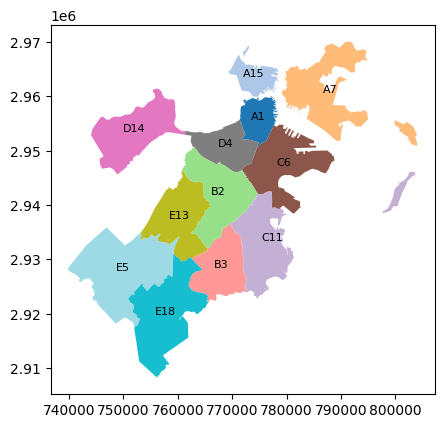

In [8]:
import geopandas as gpd
import matplotlib.pyplot as plt

police_district_df = gpd.read_file("boston-massachusetts-police-districts.shp")

# Plot the GeoDataFrame, using the 'DISTRICT' column to label the polygons and the 'tab20' colormap to assign colors
ax = police_district_df.plot(column='DISTRICT', cmap='tab20')

# Add labels to the polygons
for idx, row in police_district_df.iterrows():
    ax.annotate(text=row['DISTRICT'], xy=row['geometry'].centroid.coords[0], ha='center', fontsize=8)

plt.show()


In [9]:
import geopandas as gpd
import matplotlib.pyplot as plt

police_district_df = gpd.read_file("boston-massachusetts-police-districts.shp")

police_district_df.head()


,DISTRICT_1,DISTRICT,DISTRICT_2,STArea,BPDGIS_GIS,ID,STLength,geometry
0,1.0,A1,01,4.445582e+07,A,A1,49080.786370,"POLYGON ((777233.200 2959748.000, 777315.300 2..."
1,6.0,C6,06,1.237108e+08,C,C6,93582.798497,"POLYGON ((779407.000 2954363.800, 779390.500 2..."
2,4.0,D4,04,7.000553e+07,D,D4,41040.347429,"POLYGON ((771263.359 2955490.741, 771418.507 2..."
3,14.0,D14,14,1.236253e+08,D,D14,58025.031627,"POLYGON ((757306.200 2960067.100, 757313.100 2..."
4,13.0,E13,13,1.119417e+08,E,E13,66503.441590,"POLYGON ((761108.914 2946218.155, 761125.252 2..."


In [10]:
import folium
import json

# Initialize the map at a central location (latitude, longitude) and zoom level
m = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

# Load the City_Council_Districts GeoJSON file
city_council_geojson = "City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson"

# Add the City_Council_Districts layer to the map
folium.GeoJson(
    city_council_geojson,
    name="City Council Districts",
    popup=folium.features.GeoJsonPopup(fields=['SHORTNAME'], sticky=True,
                                                                  labels=False, opacity=1, aliases=None, max_width=100, style='font-size: 10px; padding: 50px;')
).add_to(m)

# Load the MBTA_Systemwide_GTFS_Map GeoJSON file
mbta_geojson = "MBTA_Systemwide_GTFS_Map.geojson"

# Read the GeoJSON file
with open(mbta_geojson) as f:
    mbta_data = json.load(f)

# Function to add circles to the map
def add_circle(point, map_obj):
    folium.Circle(
        location=[point["geometry"]["coordinates"][1], point["geometry"]["coordinates"][0]],
        radius=50,
        color="black",
        fill=True,
        fill_color="black",
    ).add_to(map_obj)

# Iterate through the features in the GeoJSON and add circles to the map
for feature in mbta_data["features"]:
    add_circle(feature, m)



# Add a layer control to switch between layers
folium.LayerControl().add_to(m)

# Display the map
m.save("City_council_MBTA_map.html")

m


In [11]:
#Boston Parks asserts

parks_df = pd.read_csv('Boston_parks_assets.csv')
parks_df.head()

,Park,Location,Feature(s)
0,Adams/King Playground,Dorchester,"Playground, Street Hockey"
1,Amatucci Playground,Hyde Park,"Playground, Basketball"
2,American Legion Playground,East Boston,"Playground, Basketball, Players Bench, Soccer"
3,A Street Park,South Boston,"Playground, Dog Park"
4,Back Bay Fens,Fenway/Longwood,"Playground, Basketball, Players Bench"


In [12]:

import pandas as pd
import geopandas as gpd

Police_statios_df = gpd.read_file('Boston_Police_Stations.geojson')
Police_statios_df.head()

,ADDRESS,NAME,ZIP,PARCEL_ID,OBJECTID_1,OBJECTID,BPD_ID,ID,FTSQFT,STORY_HT_,CENTROIDX,CENTROIDY,geometry
0,40 New Sudbury Street,District A-1 Police Station,02114,0302626000,1,1,1,42,6882,5.0,-71.0603,42.3618,POINT (-71.06031 42.36183)
1,650 Harrison Avenue,District D-4 Police,02116,0500826000,2,2,2,42,12382,3.0,-71.0707,42.3456,POINT (-71.06920 42.33945)
2,3345 Washington Street,District E-13 Police Station,02130,1102261000,3,3,3,42,8312,2.0,-71.1046,42.3097,POINT (-71.10463 42.30972)
3,1165 Blue Hill Avenue,District B-3 Police Station,02126,1404623000,4,4,4,42,9740,1.5,-71.0917,42.2847,POINT (-71.09174 42.28470)
4,1249 Hyde Park Avenue,District E-18 Police Station,02136,1809107000,5,5,5,42,8585,2.0,-71.1243,42.2565,POINT (-71.12427 42.25648)


In [13]:
hospitals_df = "Hospitals.geojson"
comunity_center_df = "Community_Centers.geojson"
Colleges_uni_df = "Colleges_and_Universities.geojson"
Police_statios_df = "Boston_Police_Stations.geojson"
city_council_df = "City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson"


In [14]:
#Police stations in city council 
import folium
import geopandas as gpd

# Load the data
police_stations = gpd.read_file("Boston_Police_Stations.geojson")
city_council = gpd.read_file("City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson")

# Create a map centered on Boston
m = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

# Add the city council districts to the map
folium.Choropleth(
    geo_data=city_council,
    name="City Council Districts",
#     fill_color="YlGn",
    fill_opacity=0.2,
    line_opacity=0.5,
    highlight=True,
    smooth_factor=0.5
).add_to(m)

# Add the police stations to the map
for idx, row in police_stations.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['NAME']
    ).add_to(m)

# Add a layer control to the map
folium.LayerControl().add_to(m)

m.save("City_council_PoliceStations_map.html")
m

In [15]:
import pandas as pd
import geopandas as gpd

# Load the MBTA_Systemwide_GTFS_Map.geojson file
hospitals = gpd.read_file("Hospitals.geojson")
hospitals.head()

,OBJECTID,Census_Tra,Name,Address,City,Zipcode,Statea,Contact,PhoneNumbe,Latitude,Longitude,Comment_,Primary_Alt,Alternative_Name,DailyAvg,geometry
0,1,0,Arbour Hospital,"49 Robinwood Ave, Boston, MA",,02130,,ARBOUR HOSP INC MASS CORP,617-522-4400,42.315770,-71.112250,,Primary,NaN,NaN,POINT (-71.11225 42.31578)
1,2,0,Franciscan Children's Hospital & Rehab Center,"30 Warren St, Boston, MA",,02119,,RYAN ALBERTHA K TS,(617) 254-3800,42.329740,-71.083060,,Primary,NaN,NaN,POINT (-71.08306 42.32975)
2,3,0,Hebrew Rehabilitation Center,"1200 Centre St, Boston, MA",,02131,,HEBREW REHABILITATION CNTR,617-363-8000,42.296681,-71.130734,,Primary,NaN,NaN,POINT (-71.13073 42.29669)
3,4,0,Jewish Memorial Hospital & Radius Hospital,"59 Townsend St, Boston, MA",,02119,,RADIUS-FA LTCH REALTY LLC,617-522-8110,42.318585,-71.092445,,Primary,NaN,NaN,POINT (-71.09245 42.31859)
4,5,0,Kindred Hospital,"1515 Commonwealth Ave, Boston, MA",,02135,,VENTAS LPS,617-254-1100,42.346600,-71.141850,,Primary,NaN,NaN,POINT (-71.14185 42.34661)


In [16]:
# Hospitals in city council
import folium
import geopandas as gpd

# Load the data
hospitals = gpd.read_file("Hospitals.geojson")
city_council = gpd.read_file("City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson")
hospitals
# Create a map centered on Boston
m = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

# Add the city council districts to the map
folium.Choropleth(
    geo_data=city_council,
    name="City Council Districts",
#     fill_color="YlGn",
    fill_opacity=0.2,
    line_opacity=0.5,
    highlight=True,
    smooth_factor=0.5
).add_to(m)

# Add the police stations to the map
for idx, row in hospitals.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['Name']
    ).add_to(m)

# Add a layer control to the map
folium.LayerControl().add_to(m)

m.save("City_council_Hospitals_map.html")
m

In [17]:
import pandas as pd
import geopandas as gpd

# Load the MBTA_Systemwide_GTFS_Map.geojson file
comunity_center = gpd.read_file("Community_Centers.geojson")
comunity_center.head()

,FID,OBJECTID,SITE,PHONE,FAX,STREET,NEIGH,ZIP,geometry
0,1,0.0,Pino,635-5120,635-1874,86 Boardman St.,East Boston,2128.0,POINT (-71.01083 42.38888)
1,2,0.0,Paris Street Pool*,635-1410,635-5079,113 Paris St.,East Boston,2128.0,POINT (-71.03689 42.37243)
2,3,0.0,Paris Street,635-5125,635-5079,112 Paris St.,East Boston,2128.0,POINT (-71.03752 42.37288)
3,4,0.0,Golden Age Center,635-5175,635-5647,382 Main St.,Charlestown,2129.0,POINT (-71.06992 42.37977)
4,5,0.0,Charlestown*,635-5169,635-5084,255 Medford St.,Charlestown,2129.0,POINT (-71.06095 42.38100)


In [18]:
# Community Centers in city council
import folium
import geopandas as gpd

# Load the data
comunity_center = gpd.read_file("Community_Centers.geojson")
city_council = gpd.read_file("City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson")
hospitals
# Create a map centered on Boston
m = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

# Add the city council districts to the map
folium.Choropleth(
    geo_data=city_council,
    name="City Council Districts",
#     fill_color="YlGn",
    fill_opacity=0.2,
    line_opacity=0.5,
    highlight=True,
    smooth_factor=0.5
).add_to(m)

# Add the police stations to the map
for idx, row in comunity_center.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['FID']
    ).add_to(m)

# Add a layer control to the map
folium.LayerControl().add_to(m)

m.save("City_council_CommunityCenter_map.html")
m

In [19]:
import pandas as pd
import geopandas as gpd


Colleges_and_Universities = gpd.read_file("Colleges_and_Universities.geojson")
Colleges_and_Universities.head()

,OBJECTID,Match_type,Ref_ID,ID1,Id,SchoolId,Name,Address,City,Zipcode,...,Longitude,Comment,X,Y,NumStudent12,CampusHous,NumStudents13,URL,Address2013,geometry
0,1,NCES,0,"Fruit St, Boston, Massachusetts 02114-2696",98627,431594,Massachusetts General Hospital Dietetic Intern...,"Fruit St, Boston, Massachusetts 02114",West End,365190,...,-71.070141,0300381001,772340.999867,2.957450e+06,NaN,,20,N/A,NaN,POINT (-71.07014 42.36260)
1,2,NCES & Consortium,0,"8 Ashburton Place, Boston, Massachusetts 02108...",11959,168005,Suffolk University,"8 Ashburton Pl Beacon Hill, Boston, Massachuse...",Boston,149016,...,-71.061948,0302802001,774562.025937,2.956118e+06,9101.0,21%,8675,http://www.suffolk.edu,NaN,POINT (-71.06195 42.35891)
2,3,NCES & Consortium,0,"41 Berkeley St, Boston, Massachusetts 02116",16632,165884,Benjamin Franklin Institute of Technology,"41 Berkeley St, Boston, Massachusetts 02116",South End,78750,...,-71.070186,0500688000,772358.914857,2.951441e+06,472.0,,482,http://www.bfit.edu,NaN,POINT (-71.07019 42.34611)
3,4,NCES & Consortium,0,"250 New Rutherford Ave, Boston, Massachusetts ...",1949,165112,Bunker Hill Community College,"250 New Rutherford Ave, Boston, Massachusetts ...",Charlestown,203509,...,-71.069572,0202170000,772471.759776,2.962015e+06,12934.0,,14023,http://www.bhcc.mass.edu,NaN,POINT (-71.06957 42.37513)
4,5,NCES & Consortium,0,"36 1st Avenue, Boston, Massachusetts 02129-4557",9109,166869,MGH Institute of Health Professions,"36 1st Avenue, Boston, Massachusetts 02129",Charlestown,70077,...,-71.053972,0203504000,776687.321227,2.961964e+06,928.0,,1096,http://www.mghihp.edu,NaN,POINT (-71.05397 42.37493)


In [20]:
# Colleges_and_Universities in city council
import folium
import geopandas as gpd

# Load the data
comunity_center = gpd.read_file("Colleges_and_Universities.geojson")
city_council = gpd.read_file("City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson")

# Create a map centered on Boston
m = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

# Add the city council districts to the map
folium.Choropleth(
    geo_data=city_council,
    name="City Council Districts",
#     fill_color="YlGn",
    fill_opacity=0.2,
    line_opacity=0.5,
    highlight=True,
    smooth_factor=0.5
).add_to(m)

# Add the police stations to the map
for idx, row in Colleges_and_Universities.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['Name']
    ).add_to(m)

# Add a layer control to the map
folium.LayerControl().add_to(m)

m.save("City_council_Colleges_and_Universities_map.html")
m

In [21]:
#Homicide clearance rate
homicide_clearance_rate = pd.read_csv("homicide-clearance-rate.csv")
homicide_clearance_rate

,Year,Homicides,Same Year Clear,Previous Year Clear,Same Year Not Cleared,Total Clear,Percent Cleared Same Year,Percent Cleared Previous Year,Percent Not Cleared Same Year,Clearance Rate,Percent of Cleared Same Year,Percent of Cleared Previous Year
0,2020,57,19,1,38,20,0.3333,0.0175,0.6667,0.3509,0.9500,0.0500
1,2019,37,17,7,20,24,0.4595,0.1892,0.5405,0.6486,0.7083,0.2917
2,2018,56,32,6,24,38,0.5714,0.1071,0.4286,0.6786,0.8421,0.1579
3,2017,57,26,9,31,35,0.4561,0.1579,0.5439,0.6140,0.7429,0.2571
4,2016,49,19,11,30,30,0.3878,0.2245,0.6122,0.6122,0.6333,0.3667
5,2015,40,16,13,24,29,0.4000,0.3250,0.6000,0.7250,0.5517,0.4483


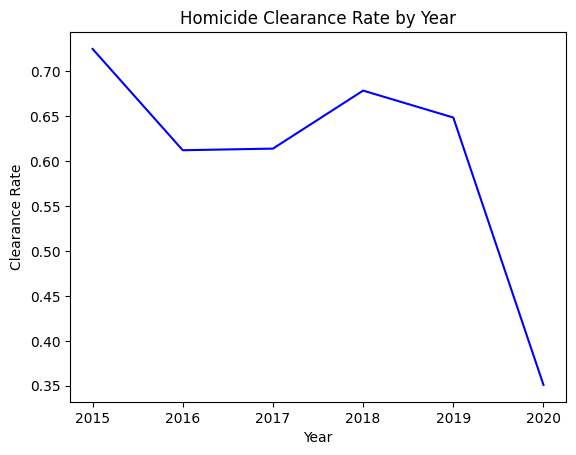

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data from the CSV file
homicide_clearance_rate = pd.read_csv("homicide-clearance-rate.csv")

# Create a line chart of the Clearance Rate by Year
plt.plot(homicide_clearance_rate["Year"], homicide_clearance_rate["Clearance Rate"], color="blue")

# Set the chart title and axis labels
plt.title("Homicide Clearance Rate by Year")
plt.xlabel("Year")
plt.ylabel("Clearance Rate")

# Show the chart
plt.show()


In [23]:
import pandas as pd
cir2021 = pd.read_csv("CIR_2021.csv")

cir2022 = pd.read_csv("CIR_2022.csv")
cir = pd.concat([cir2021, cir2022])


C:\Users\iamhe\AppData\Local\Temp\ipykernel_15604\411129959.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  cir2021 = pd.read_csv("CIR_2021.csv")
C:\Users\iamhe\AppData\Local\Temp\ipykernel_15604\411129959.py:4: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  cir2022 = pd.read_csv("CIR_2022.csv")


In [24]:
print(cir.shape)
cir.head(50)


(145573, 17)


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,212021001,619,NaN,LARCENY ALL OTHERS,B2,181,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,ALLERTON ST & MAGAZINE ST\nROXBURY MA 02119\n...,42.327551,-71.069162,"(42.327550999587764, -71.0691619893362)"
1,212025963,3201,NaN,PROPERTY - LOST/ MISSING,B3,465,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,WHITFIELD ST,42.284826,-71.091374,"(42.28482576580488, -71.09137368938802)"
2,212022379,1102,NaN,FRAUD - FALSE PRETENSE / SCHEME,C6,574,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,MARINE RD,42.309719,-71.104294,"(42.30971856767274, -71.10429431787648)"
3,212019050,615,NaN,LARCENY THEFT OF MV PARTS & ACCESSORIES,A1,77,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,STANIFORD ST,42.361839,-71.059765,"(42.361838566564714, -71.05976489094158)"
4,212019422,3115,NaN,INVESTIGATE PERSON,B3,355,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,FULLER ST,42.297555,-71.059709,"(42.29755532959655, -71.05970910242573)"
5,212058122,1102,NaN,FRAUD - FALSE PRETENSE / SCHEME,B2,282,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,WASHINGTON ST,42.328663,-71.085634,"(42.32866283555608, -71.08563401183545)"
6,212032563,1102,NaN,FRAUD - FALSE PRETENSE / SCHEME,B3,465,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,BLUE HILL AVE,42.284826,-71.091374,"(42.28482576580488, -71.09137368938802)"
7,212006298,1107,NaN,FRAUD - IMPERSONATION,C11,355,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,RIDGEWOOD ST,42.297555,-71.059709,"(42.29755532959655, -71.05970910242573)"
8,212008707,1102,NaN,FRAUD - FALSE PRETENSE / SCHEME,B3,691,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,GREENOCK ST,42.287094,-71.148221,"(42.28709355259107, -71.14822128377165)"
9,212000092,1402,NaN,VANDALISM,A1,86,0,2021-01-01 00:00:00,2021,1,Friday,0,NaN,SALEM ST,42.363398,-71.056002,"(42.36339790491148, -71.05600208188557)"


In [25]:
cir_shootings = cir[cir['SHOOTING']>0]
print(cir_shootings.shape)
cir_shootings = cir_shootings.dropna(subset=['Lat', 'Long'])
print(cir_shootings.shape)


(1642, 17)
(1612, 17)


In [26]:
cir_shootings['OFFENSE_DESCRIPTION'].unique()

array(['INVESTIGATE PROPERTY', 'ASSAULT - AGGRAVATED', 'VANDALISM',
       'BALLISTICS EVIDENCE/FOUND', 'INVESTIGATE PERSON', 'ROBBERY',
       'MURDER, NON-NEGLIGIENT MANSLAUGHTER',
       'WEAPON VIOLATION - CARRY/ POSSESSING/ SALE/ TRAFFICKING/ OTHER',
       'SERVICE TO OTHER AGENCY', 'OTHER OFFENSE',
       'M/V ACCIDENT - PROPERTY DAMAGE', 'MANSLAUGHTER - NEGLIGENCE',
       'FIREARM/WEAPON - FOUND OR CONFISCATED', 'DEATH INVESTIGATION',
       'ASSAULT - SIMPLE', 'AUTO THEFT', 'BURGLARY - RESIDENTIAL',
       'M/V - LEAVING SCENE - PROPERTY DAMAGE',
       'VAL - VIOLATION OF AUTO LAW', 'M/V ACCIDENT - POLICE VEHICLE',
       'SICK/INJURED/MEDICAL - PERSON', 'VERBAL DISPUTE',
       'DRUGS - POSSESSION/ SALE/ MANUFACTURING/ USE',
       'SICK/INJURED/MEDICAL - POLICE', 'M/V ACCIDENT - OTHER',
       'SUICIDE / SUICIDE ATTEMPT', 'VAL - OPERATING AFTER REV/SUSP.',
       'PROPERTY - STOLEN THEN RECOVERED',
       'FIREARM/WEAPON - ACCIDENTAL INJURY / DEATH',
       'MURDER, NON-NE

In [27]:
import pandas as pd
import folium

# read in the CSV data into a pandas dataframe


# create a folium map centered on Boston
map = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

# iterate over the rows in the dataframe and add markers to the map
for index, row in cir_shootings.iterrows():
    # get the latitude and longitude from the row
    lat = row['Lat']
    long = row['Long']
    
    # create a marker for the incident location
    marker = folium.Circle(location=[lat, long])
    
    # add the marker to the map
    marker.add_to(map)

# display the map
map


In [28]:
firearm_recovery = pd.read_csv("Firearm_recovery_count.csv")

In [29]:
firearm_recovery.head()


,CollectionDate,CrimeGunsRecovered,GunsRecoveredSafeguard,BuybackGunsRecovered
0,2014-08-19,292,134.0,369.0
1,2014-08-20,2,3.0,1.0
2,2014-08-21,2,0.0,4.0
3,2014-08-22,0,0.0,2.0
4,2014-08-25,8,3.0,0.0


In [30]:
firearm_recovery['CollectionDate'] = pd.to_datetime(firearm_recovery['CollectionDate'])

# add a new 'Year' column with the extracted year values
firearm_recovery['Year'] = firearm_recovery['CollectionDate'].dt.year
firearm_recovery = firearm_recovery[firearm_recovery['Year'] != 2023]
# print the updated dataframe
firearm_recovery.head()

,CollectionDate,CrimeGunsRecovered,GunsRecoveredSafeguard,BuybackGunsRecovered,Year
0,2014-08-19,292,134.0,369.0,2014
1,2014-08-20,2,3.0,1.0,2014
2,2014-08-21,2,0.0,4.0,2014
3,2014-08-22,0,0.0,2.0,2014
4,2014-08-25,8,3.0,0.0,2014


In [31]:
firearm_recovery['Year'].unique()

array([2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022], dtype=int64)

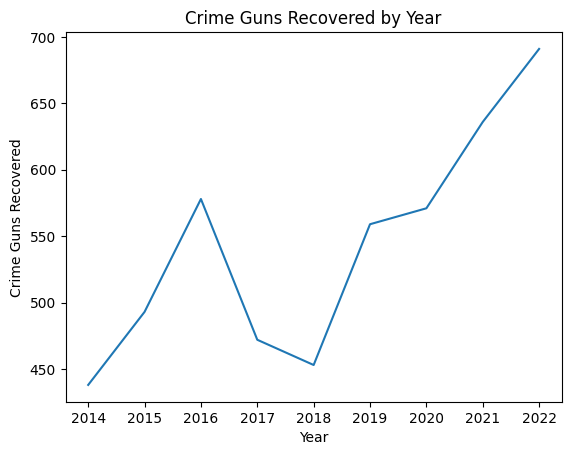

In [32]:
import pandas as pd
import matplotlib.pyplot as plt


# group the dataframe by year and aggregate the 'CrimeGunsRecovered' column by sum
yearly_recovery = firearm_recovery.groupby('Year')['CrimeGunsRecovered'].sum().reset_index()

# create a line plot of the 'CrimeGunsRecovered' values in each year
plt.plot(yearly_recovery['Year'], yearly_recovery['CrimeGunsRecovered'])
plt.xlabel('Year')
plt.ylabel('Crime Guns Recovered')
plt.title('Crime Guns Recovered by Year')

plt.xticks(yearly_recovery['Year'])

plt.show()


In [33]:
import folium
import json
from folium.plugins import MarkerCluster

# Initialize the map at a central location (latitude, longitude) and zoom level
m = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

# Create a marker cluster for the incident locations
marker_cluster = MarkerCluster().add_to(m)

# Loop through the rows of the cir_shootings dataframe and add a circle marker for each incident location
for index, row in cir_shootings.iterrows():
    # get the latitude and longitude from the row
    lat = row['Lat']
    long = row['Long']
    
    # create a marker for the incident location
    marker = folium.Circle(location=[lat, long],color='#FF5733')
    
    # add the marker to the marker cluster
    marker.add_to(marker_cluster)

# Load the City_Council_Districts GeoJSON file
city_council_geojson = "City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson"

# Add the City_Council_Districts layer to the map
folium.GeoJson(
    city_council_geojson,
    name="City Council Districts",
    popup=folium.features.GeoJsonPopup(fields=['SHORTNAME'], sticky=True,
                                                                  labels=False, opacity=1, aliases=None, max_width=100, style='font-size: 10px; padding: 50px;')
).add_to(m)

# Load the MBTA_Systemwide_GTFS_Map GeoJSON file
mbta_geojson = "MBTA_Systemwide_GTFS_Map.geojson"

# Read the GeoJSON file
with open(mbta_geojson) as f:
    mbta_data = json.load(f)

# Function to add circles to the map
def add_circle(point, map_obj):
    folium.Circle(
        location=[point["geometry"]["coordinates"][1], point["geometry"]["coordinates"][0]],
        radius=50,
        color="black",
        fill=True,
        fill_color="black",
    ).add_to(map_obj)

# Iterate through the features in the GeoJSON and add circles to the map
for feature in mbta_data["features"]:
    add_circle(feature, m)

# Add a layer control to switch between layers
folium.LayerControl().add_to(m)

# Add a legend for the black and red circle markers
legend_html = '''
     <div style="position: fixed; 
     bottom: 50px; left: 50px; width: 150px; height: 90px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color: white;
     "><p style="margin-left: 10px; margin-top: 5px"> <b>Legend</b></p> 
     
     <p style="margin-left: 10px; margin-top: 5px"><span style='color:black'>&#9679;</span> MBTA stops</p>
      </div>
     '''
     
m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
m.save("Shooting_MBTAstops.html")
m

In [34]:
streetlights = pd.read_csv("streetlight-locations.csv")
streetlights.dropna(subset=['Lat', 'Long'], inplace=True)
print(streetlights.shape)
streetlights.head()

(74065, 5)


,the_geom,OBJECTID,TYPE,Lat,Long
0,POINT (-71.0760443807948 42.35315925057316),1,LIGHT,42.353159,-71.076044
1,POINT (-71.07538171240694 42.353347768071195),2,LIGHT,42.353348,-71.075382
2,POINT (-71.07477488057383 42.35352052068278),3,LIGHT,42.353521,-71.074775
3,POINT (-71.07440373484715 42.3535558201314),4,LIGHT,42.353556,-71.074404
4,POINT (-71.07362079549182 42.35381056415504),5,LIGHT,42.353811,-71.073621


In [35]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# read the csv file into a pandas DataFrame
df = pd.read_csv('streetlight-locations.csv')

# define the grid size in degrees for grouping the street lights
grid_size = 0.01

# create a new column in the DataFrame with the grid cell coordinates
df['grid_lat'] = (df['Lat'] // grid_size) * grid_size
df['grid_long'] = (df['Long'] // grid_size) * grid_size

# group the street lights by grid cell and count the number of street lights in each cell
counts = df.groupby(['grid_lat', 'grid_long']).size().reset_index(name='count')

# download the US states GeoJSON data from a URL
url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
state_geo = f'{url}/us-states.json'

# create a folium map centered on Boston
m = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

# add a choropleth layer to the map showing the street light counts by grid cell
folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=counts,
    columns=['grid_lat', 'grid_long', 'count'],
    key_on='feature.id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Street Light Count'
).add_to(m)

# add a heatmap layer to the map showing the density of street lights
heatmap_data = [[row['Lat'], row['Long']] for index, row in df.iterrows()]
HeatMap(heatmap_data, name='Heatmap').add_to(m)

# add a layer control to the map to toggle the layers on and off
folium.LayerControl().add_to(m)

# display the map
m


In [36]:
import geopandas as gpd
import folium

# read in the ZIP codes GeoJSON file
zipcodes = gpd.read_file('ZIP_Codes.geojson')

# read in the City Council Districts GeoJSON file
districts = gpd.read_file('City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson')

# create a folium map centered on Boston
m = folium.Map(location=[42.3601, -71.0589], zoom_start=11)

# add the City Council Districts layer to the map with blue borders
folium.Choropleth(
    geo_data=districts,
    name='City Council Districts',
    line_color='blue',
    fill_opacity=0,
    line_opacity=2,
    highlight=True,
    smooth_factor=0
).add_to(m)

# add the ZIP codes layer to the map with red borders and labels
folium.GeoJson(
    zipcodes,
    name='ZIP Codes',
    style_function=lambda x: {'color': 'red', 'weight': 1, 'fillOpacity': 0},
    highlight_function=lambda x: {'weight': 3},
    tooltip=folium.GeoJsonTooltip(fields=['ZIP5'], labels=True, sticky=True)
).add_to(m)

# add a layer control to the map to toggle the layers on and off
folium.LayerControl().add_to(m)

# display the map
m


In [37]:
cc_d4 = ['Dorchester', 'Mattapan', 'Roslindale', 'Jamaica Plain']

In [38]:
alcohol = pd.read_csv("Alcohol.csv")
alcohol.dropna(subset=['zip'], inplace=True)
alcohol.head()

,license_num,historicallicensenum,status,license_type,issued,expires,business_name,dba_name,comments,location_comments,...,applicant,manager,day_phone,evening_phone,address,city,state,zip,gpsx,gpsy
0,LB-492568,NaN,Active,CV7 All Alc. Restrict.,NaN,NaN,"Midnight Morning, LLC",Midnight Morning,NaN,In one room on the first floor: kitchen and st...,...,"Midnight Morning, LLC",Virginia Schubert,(757)593-5494,NaN,14B Birch ST,Roslindale,MA,02131,756294.698115,2.929750e+06
1,LB-456201,NaN,Active,CV7 Malt Wine,NaN,NaN,"Oasis Enterprize Group, Inc.",Oasis Restaurant,NaN,One room (2200 square feet) Restaurant dining ...,...,"Oasis Enterprize Group, Inc.",Chesterfield Coppin,(617)740-8288,NaN,33- Hancock ST,Dorchester,MA,02125,773590.049372,2.939883e+06
2,LB-471196,NaN,Active,CV7 All Alc.,NaN,NaN,"MIDA East Boston, LLC",MIDA,NaN,"4,523SF total: 2,873SF in one main room on gro...",...,"MIDA East Boston, LLC",Seth Gerber,(203)494-7973,NaN,65- Lewis St,East Boston,MA,02128,779829.589386,2.959337e+06
3,LB-519524,NaN,Active,Retail Malt Wine,2023-03-03,2023-12-31,Neighborhood Guy LLC,Neighborhood Wines,NaN,Approximately 800sf in two rooms on ground flo...,...,Neighborhood Guy LLC,Spenser Payne,(425)753-6298,NaN,619- Tremont ST,Boston,MA,02118,771234.079130,2.950214e+06
4,LB-495217,NaN,Active,CV7 All Alc. Airp.,2023-02-21,2023-12-31,"SODEXO OPERATIONS, LLC",Chase Sapphire Lounge by the Club,NaN,"11,570SF business lounge located within Termin...",...,"Sodexo Operations, LLC",Noah Smith,(301)587-4504,NaN,200 Logan Airport Terminal B,East Boston,MA,02128,0.000000,0.000000e+00


In [39]:
alcohol['city'].unique()

array(['Roslindale', 'Dorchester', 'East Boston', 'Boston',
       'Jamaica Plain', 'South Boston', 'Charlestown', 'Brighton',
       'West Roxbury', 'Mattapan', 'Roxbury', 'Hyde Park', 'Allston',
       'Mission Hill', 'BOSTON', 'BRIGHTON', 'Chestnut Hill'],
      dtype=object)

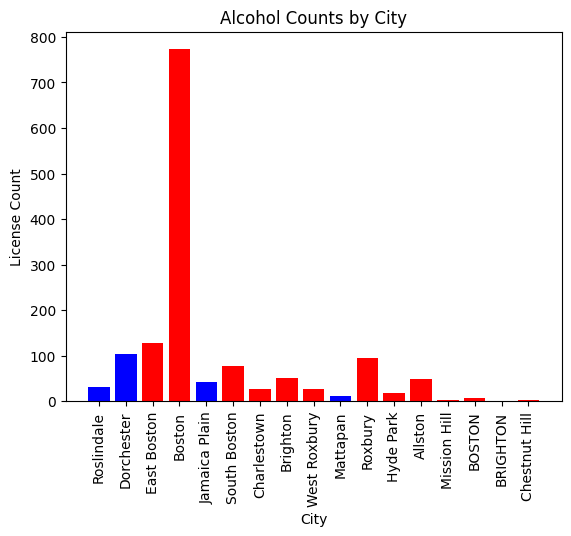

In [40]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the alcohol data
alcohol = pd.read_csv("Alcohol.csv")

# Define the list of adjacent cities
cc_d4 = ['Dorchester', 'Mattapan', 'Roslindale', 'Jamaica Plain']

# Create a dictionary to store the counts for each city
city_counts = {}

# Loop over each row of the alcohol data and count the licenses for each city
for index, row in alcohol.iterrows():
    city = row['city']
    if city in city_counts:
        city_counts[city] += 1
    else:
        city_counts[city] = 1

# Define the colors for the adjacent cities and the other cities
adjacent_color = 'blue'
other_color = 'red'

# Create a list to store the colors for each city
colors = []

# Loop over each city in the city_counts dictionary and assign a color based on whether it is adjacent or not
for city in city_counts:
    if city in cc_d4:
        colors.append(adjacent_color)
    else:
        colors.append(other_color)

# Create a bar chart of the city counts, with the colors defined by the colors list
plt.bar(city_counts.keys(), city_counts.values(), color=colors)

# Set the title and axis labels
plt.title("Alcohol Counts by City")
plt.xlabel("City")
plt.xticks(rotation=90)

plt.ylabel("License Count")

# Show the plot
plt.show()


In [41]:
request311 = pd.read_csv("311.csv")

In [42]:
request311.shape

(276723, 29)

In [43]:
request311.head()

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
0,101004125189,2022-01-13 12:59:00,2022-01-20 12:59:39,NaN,OVERDUE,Open,,Illegal Rooming House,Inspectional Services,Building,...,C11,Dorchester,8,Ward 17,1706,27 Lithgow St,2124.0,42.2896,-71.0701,Constituent Call
1,101004161747,2022-02-02 11:42:49,2022-02-16 11:42:49,2022-02-02 11:45:47,ONTIME,Closed,Case Closed Case Noted,PublicWorks: Complaint,Mayor's 24 Hour Hotline,Employee & General Comments,...,,,,,,NaN,NaN,42.3594,-71.0587,Constituent Call
2,101004149944,2022-01-28 19:36:00,NaN,NaN,ONTIME,Open,,Space Savers,Public Works Department,Sanitation,...,B3,Greater Mattapan,9,Ward 14,1411,492 Harvard St,2124.0,42.2876,-71.0936,Constituent Call
3,101004113302,2022-01-01 00:36:24,2022-01-04 08:30:00,2022-01-03 00:13:17,ONTIME,Closed,Case Closed. Closed date : 2022-01-03 00:13:17...,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,...,C6,South Boston / South Boston Waterfront,5,6,0601,INTERSECTION Seaport Blvd & Sleeper St,NaN,42.3594,-71.0587,Citizens Connect App
4,101004122704,2022-01-11 09:47:00,2022-02-10 09:47:22,NaN,OVERDUE,Open,,DISPATCHED Heat - Excessive Insufficient,Inspectional Services,Housing,...,B2,Roxbury,13,Ward 12,1202,15 Crawford St,2121.0,42.3110,-71.0841,Constituent Call


In [44]:
request311['case_title'].nunique()

6575

In [45]:
# FIO dataset
import pandas as pd
fieldContact_df = pd.read_csv("fio-records-2022-mark43-fieldcontact-table.csv")
fieldContactName_df = pd.read_csv("fio-records-2022-mark43-fieldcontact_name-table.csv")
fieldContact21_df = pd.read_csv("fio-records-2022-mark43-fieldcontact-table.csv")
fieldContactName21_df = pd.read_csv("fio-records-2022-mark43-fieldcontact_name-table.csv")

fio_df = pd.merge(fieldContact_df, fieldContactName_df, how='inner', left_on = 'fc_num', right_on = 'fc_num')
fio_df.shape

(9458, 35)

In [46]:
fio_df.head()

,fc_num,contact_date_x,contact_officer,contact_officer_name,supervisor,supervisor_name,street,city,state,zip,...,race,age,build,hair_style,ethnicity,skin_tone,deceased,license_type,license_state,was_frisked
0,FC22000008,2022-01-01 00:00:00,151206,"WATTY-NILES, CREFTON",11586,CHRISTOPHER CARROLL,ALBANY ST,BOSTON,MA,2118,...,Black,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,0.0
1,FC22000001,2022-01-01 02:30:00,153132,"VILLEGAS-HOAG, STEPHANIE",11212,MICHAEL MCCARTHY,NaN,BOSTON,MA,2122,...,Black,25.0,Thin,Short,Not of Hispanic Origin,Brown,0,Personal Driver License,MA,1.0
2,FC22000004,2022-01-01 09:29:00,148290,"PARHAM, ANTHONY",10845,JAMES MOORE,BRIARCLIFF,MATTAPAN,MA,2126,...,Black,39.0,Medium,Bald or Balding,Not of Hispanic Origin,Medium Brown,0,Class D,MA,1.0
3,FC22000004,2022-01-01 09:29:00,148290,"PARHAM, ANTHONY",10845,JAMES MOORE,BRIARCLIFF,MATTAPAN,MA,2126,...,Black,35.0,NaN,NaN,Not of Hispanic Origin,NaN,0,Class D,MA,NaN
4,FC22000003,2022-01-01 10:16:00,162319,"Uhrig, Robert",9266,STEVEN CICCOLO,E EIGHTH ST,SOUTH BOSTON,MA,2127,...,White,54.0,Medium,NaN,Not of Hispanic Origin,NaN,0,NaN,NaN,0.0


In [47]:
fio_df.dropna(subset=['age'], inplace=True)

In [48]:
fio_df.to_csv('fio_data.csv', index=False)

In [49]:
fio_df['city'].unique()

array(['BOSTON', 'MATTAPAN', 'SOUTH BOSTON', 'DORCHESTER', 'HYDE PARK',
       'ROXBURY', 'WEST ROXBURY', 'BRIGHTON', 'EAST BOSTON',
       'JAMAICA PLAIN', 'ROSLINDALE', 'DEDHAM', 'BOSOTN', 'CHARLESTOWN',
       'PROVIDENCE', 'WATERTOWN', 'NEEDHAM', 'CAMBRIDGE', 'SALEM',
       'TOWN OF BROOKLINE', 'MARSHFIELD', 'TOWN OF MILTON', 'BROCKTON',
       'NEWTON', 'TOWN OF WINCHESTER', 'QUINCY', 'WALPOLE', 'WALTHAM'],
      dtype=object)

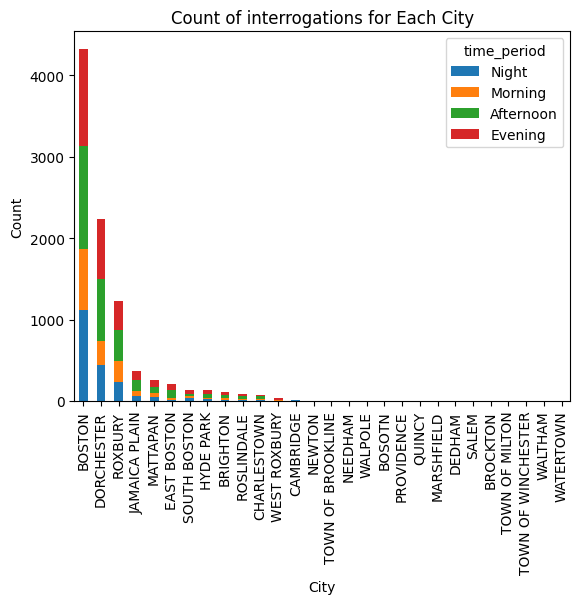

In [50]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert contact_date_x column to datetime object
fio_df['contact_date_x'] = pd.to_datetime(fio_df['contact_date_x'])

# Extract hour component from datetime object
fio_df['hour'] = fio_df['contact_date_x'].dt.hour

# Bin hours into time periods
bins = [0, 6, 12, 18, 24]
labels = ['Night', 'Morning', 'Afternoon', 'Evening']
fio_df['time_period'] = pd.cut(fio_df['hour'], bins=bins, labels=labels, include_lowest=True)

# Group by city and time period, count number of observations
city_time_period_counts = fio_df.groupby(['city', 'time_period'])['fc_num'].count()

# Reshape data to wide format for stacked bar chart
city_time_period_counts = city_time_period_counts.unstack(level='time_period')

# Calculate total count for each city and sort in descending order
city_counts = city_time_period_counts.sum(axis=1)
sorted_cities = city_counts.sort_values(ascending=False).index

# Reorder columns in stacked bar chart based on sorted cities
city_time_period_counts = city_time_period_counts[labels].loc[sorted_cities]

# Create stacked bar chart
city_time_period_counts.plot(kind='bar', stacked=True)
plt.title('Count of interrogations for Each City')
plt.xlabel('City')
plt.ylabel('Count')
plt.show()


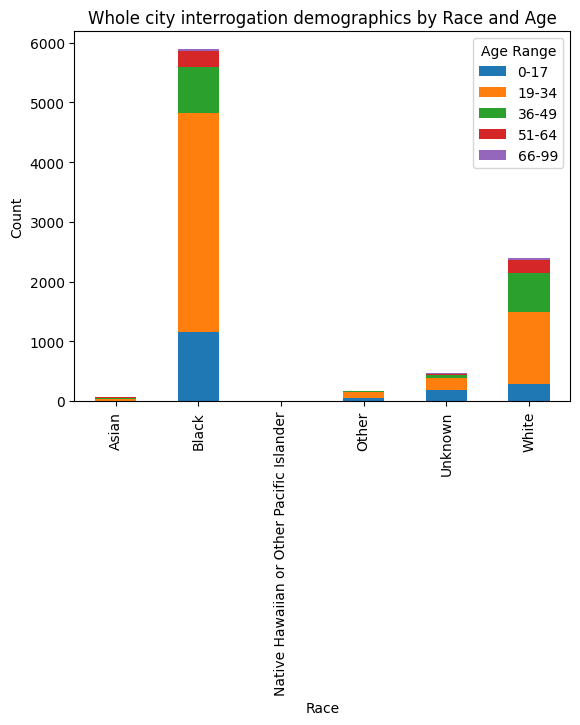

In [51]:
import matplotlib.pyplot as plt

# Define the age ranges you want to visualize
age_ranges = [(0, 18), (19, 35), (36, 50), (51, 65), (66, 100)]

# Group the data by race and age, and get the count of each demographic group
demographics = fio_df.groupby(['race', pd.cut(fio_df['age'], bins=[r[0] for r in age_ranges] + [r[1] for r in age_ranges[-1:]], labels=[f'{r[0]}-{r[1]-1}' for r in age_ranges])]).size()

# Reshape the data to a matrix with races as rows and age ranges as columns
demographics = demographics.unstack()

# Plot the data as a stacked bar chart
demographics.plot(kind='bar', stacked=True)

# Add a legend and labels
plt.legend(title='Age Range')
plt.xlabel('Race')
plt.ylabel('Count')
plt.title('Whole city interrogation demographics by Race and Age')
plt.show()


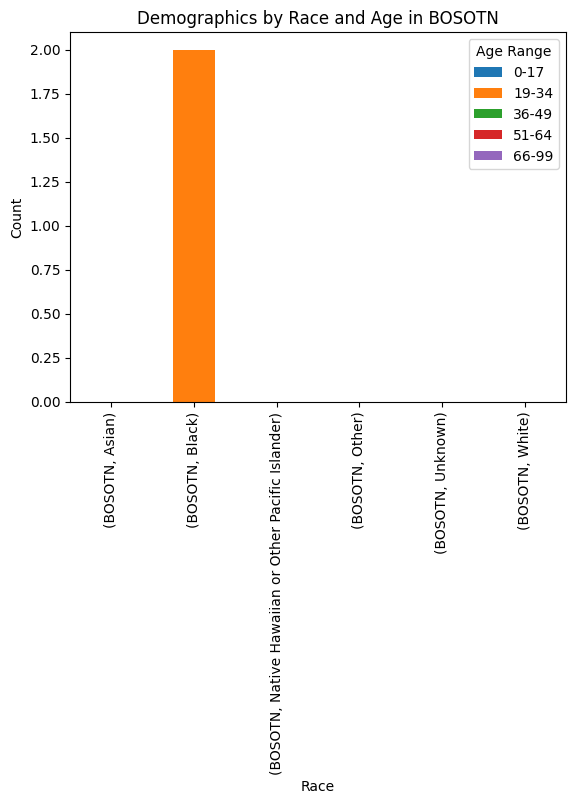

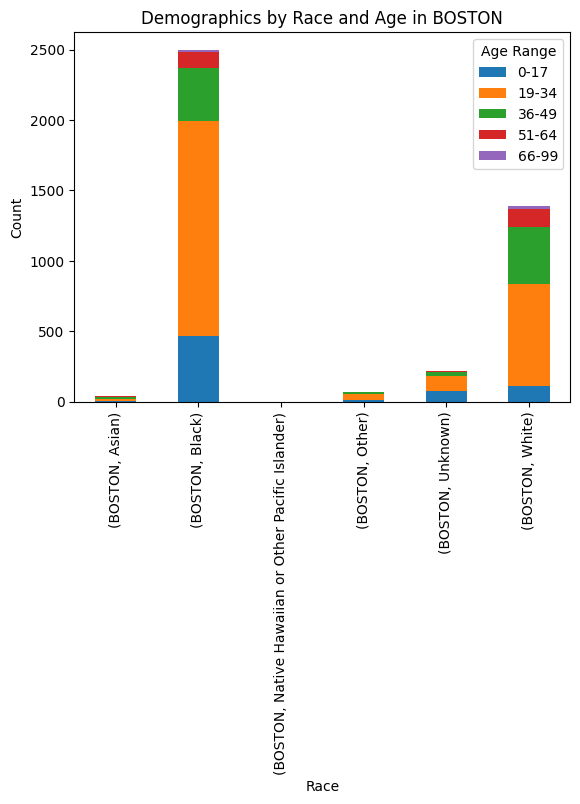

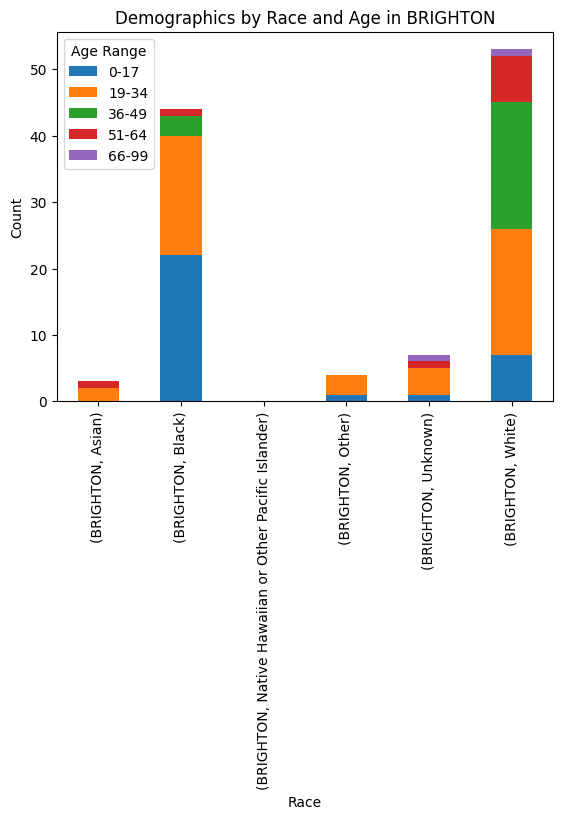

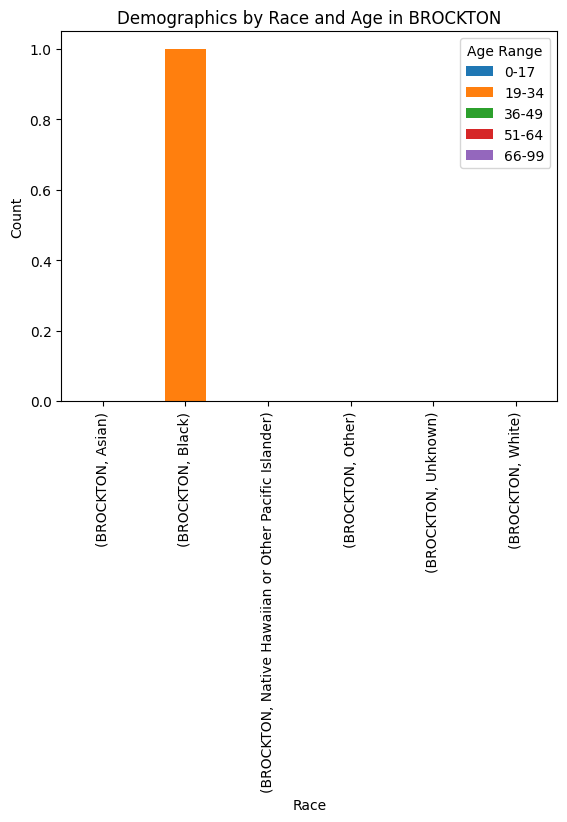

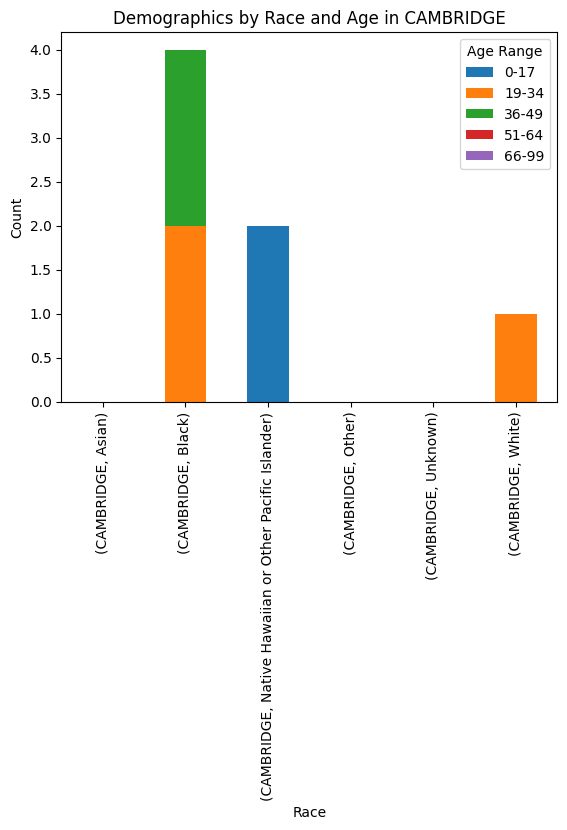

...

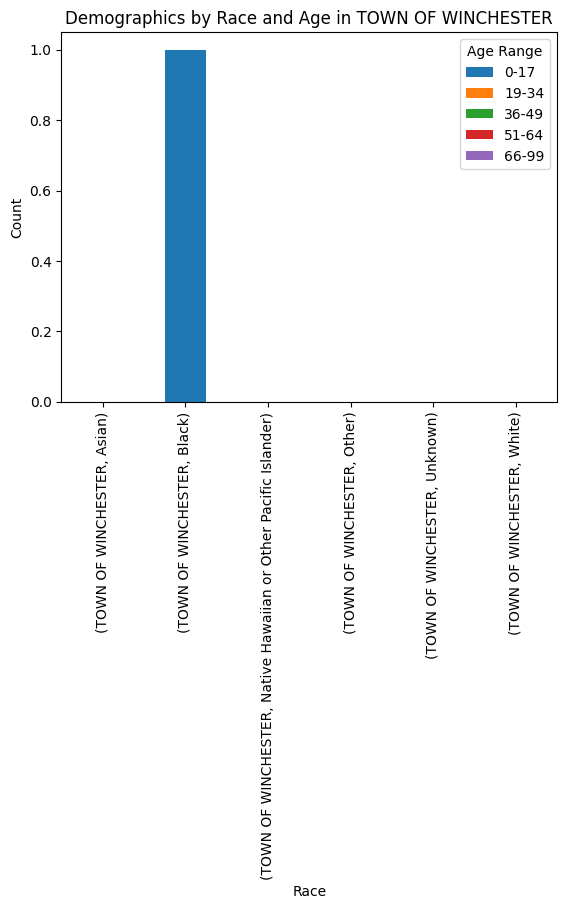

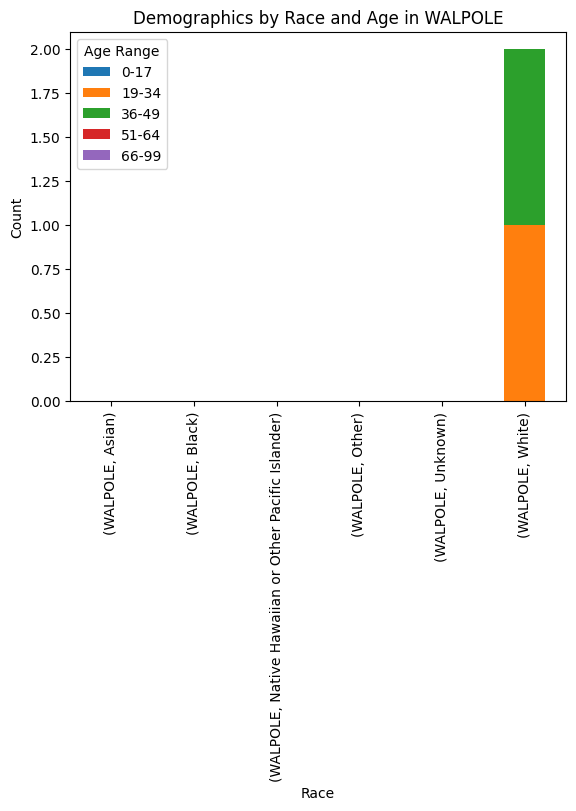

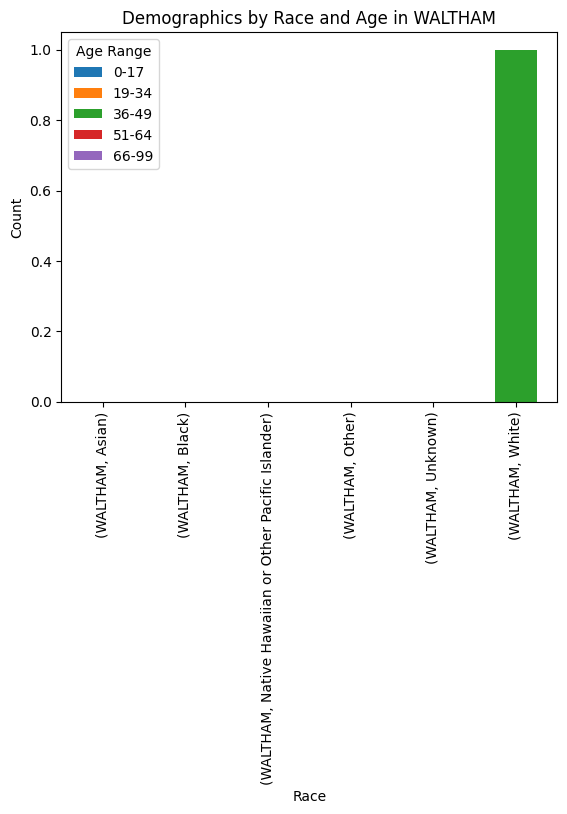

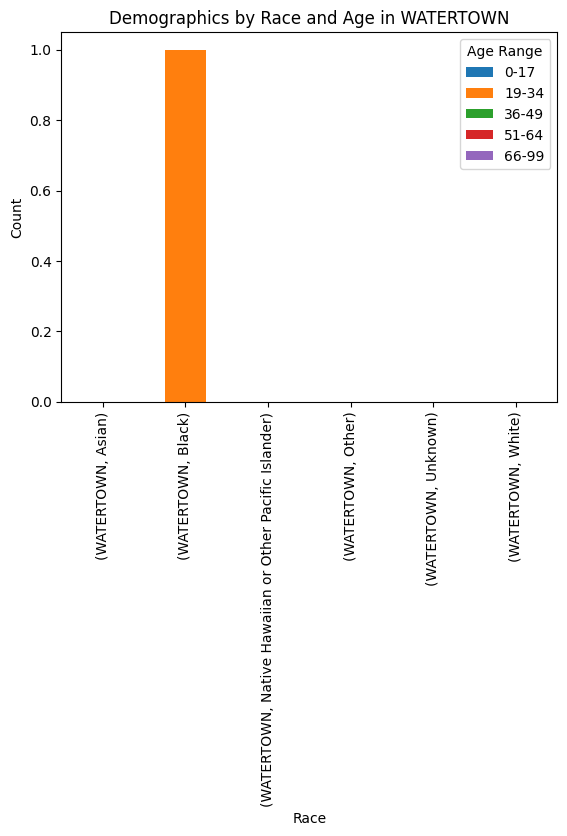

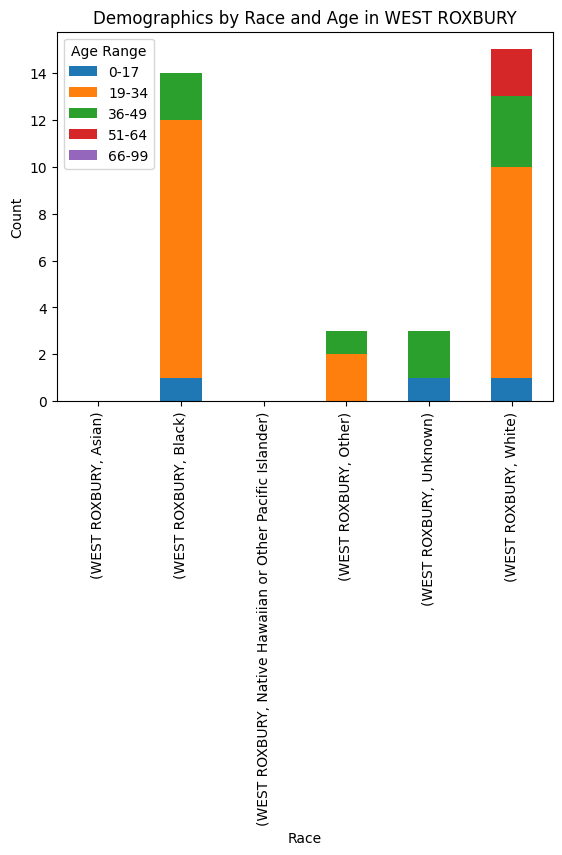

In [52]:
import matplotlib.pyplot as plt

# Define the age ranges you want to visualize
age_ranges = [(0, 18), (19, 35), (36, 50), (51, 65), (66, 100)]

# Group the data by city, race, and age, and get the count of each demographic group
demographics = fio_df.groupby(['city', 'race', pd.cut(fio_df['age'], bins=[r[0] for r in age_ranges] + [r[1] for r in age_ranges[-1:]], labels=[f'{r[0]}-{r[1]-1}' for r in age_ranges])]).size()

# Loop through each city and create a stacked bar chart
for city, data in demographics.groupby('city'):
    # Reshape the data to a matrix with races as rows and age ranges as columns
    data = data.unstack()

    # Plot the data as a stacked bar chart
    data.plot(kind='bar', stacked=True)

    # Add a legend and labels
    plt.legend(title='Age Range')
    plt.xlabel('Race')
    plt.ylabel('Count')
    plt.title(f"Demographics by Race and Age in {city}")
    plt.show()


# Only gun firearm ballistic evidence contact reason data

In [53]:
import pandas as pd



# define a list of keywords to search for
keywords = ["gun", "firearm", "ballistic evidence", "Ammunition", "weapon"]

fio_df.dropna(subset=["contact_reason"], inplace=True)

# create a boolean mask indicating which rows contain any of the keywords
mask = fio_df["contact_reason"].str.contains("|".join(keywords), case=False)

# select the rows that match the mask
fio_firearm = fio_df[mask]

# print the matching rows
fio_firearm.shape


(1552, 37)

In [54]:
import pandas as pd

# Assuming you already have the fio_firearm DataFrame

# Save the DataFrame to a CSV file
fio_firearm.to_csv('fio_firearm.csv', index=False)
fio_firearm_cleaned = pd.read_csv("fio_firearm_cleaned.csv")

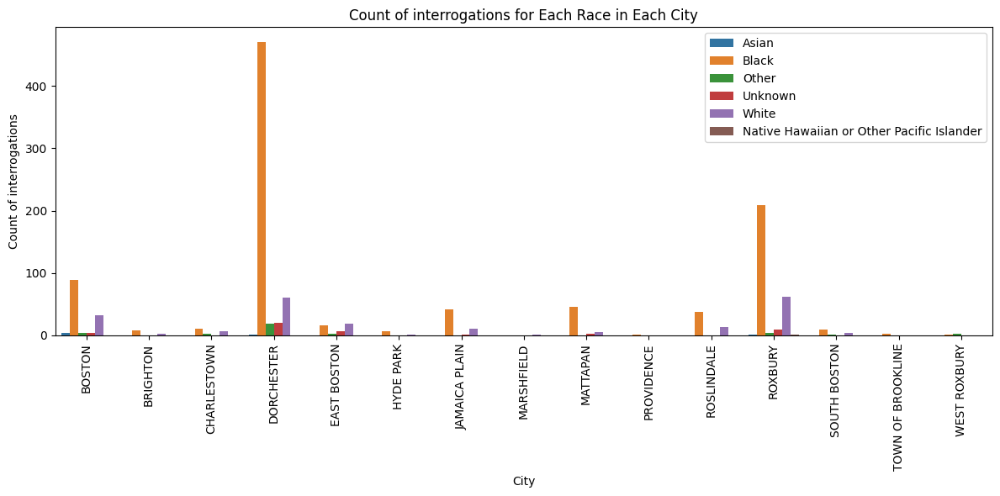

In [55]:
#Each city vs race count if incidents

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the fio_firearm_cleaned DataFrame
fio_firearm_cleaned = pd.read_csv("fio_firearm_cleaned.csv")

# Group the data by city and race, and get the count of fc_num for each group
grouped_data = fio_firearm_cleaned.groupby(['city', 'race']).size().reset_index(name='count')

# Create a bar plot with seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='city', y='count', hue='race', data=grouped_data)

# Set the axis labels and title
plt.xlabel('City')
plt.ylabel('Count of interrogations')
plt.xticks(rotation = 90)
plt.title('Count of interrogations for Each Race in Each City')
plt.legend(loc='upper right')
# Show the plot
plt.tight_layout()
plt.show()


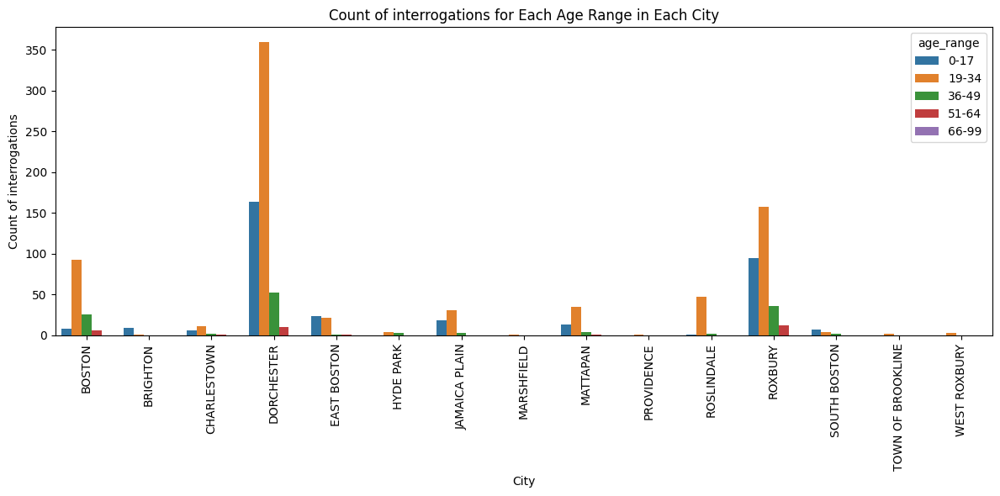

In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the fio_firearm_cleaned DataFrame
fio_firearm_cleaned = pd.read_csv("fio_firearm_cleaned.csv")

# Define the age ranges you want to visualize
age_ranges = [(0, 18), (19, 35), (36, 50), (51, 65), (66, 100)]

# Group the data by city and age ranges, and get the count of fc_num for each group
grouped_data = fio_firearm_cleaned.groupby(['city', pd.cut(fio_firearm_cleaned['age'], bins=[r[0] for r in age_ranges] + [r[1] for r in age_ranges[-1:]], labels=[f'{r[0]}-{r[1]-1}' for r in age_ranges])]).size().reset_index(name='count')
grouped_data.columns = ['city', 'age_range', 'count']

# Create a bar plot with seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='city', y='count', hue='age_range', data=grouped_data)

# Set the axis labels and title
plt.xlabel('City')
plt.ylabel('Count of interrogations')
plt.title('Count of interrogations for Each Age Range in Each City')

# Rotate the x-axis labels
plt.xticks(rotation=90)

# Show the plot
plt.tight_layout()
plt.show()


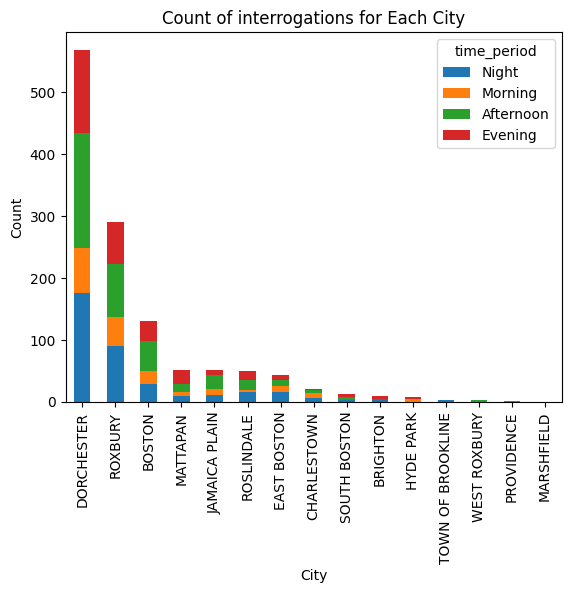

In [57]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert contact_date_x column to datetime object
fio_firearm_cleaned['contact_date_x'] = pd.to_datetime(fio_df['contact_date_x'])

# Extract hour component from datetime object
fio_firearm_cleaned['hour'] = fio_firearm_cleaned['contact_date_x'].dt.hour

# Bin hours into time periods
bins = [0, 6, 12, 18, 24]
labels = ['Night', 'Morning', 'Afternoon', 'Evening']
fio_firearm_cleaned['time_period'] = pd.cut(fio_firearm_cleaned['hour'], bins=bins, labels=labels, include_lowest=True)

# Group by city and time period, count number of observations
city_time_period_counts = fio_firearm_cleaned.groupby(['city', 'time_period'])['fc_num'].count()

# Reshape data to wide format for stacked bar chart
city_time_period_counts = city_time_period_counts.unstack(level='time_period')

# Calculate total count for each city and sort in descending order
city_counts = city_time_period_counts.sum(axis=1)
sorted_cities = city_counts.sort_values(ascending=False).index

# Reorder columns in stacked bar chart based on sorted cities
city_time_period_counts = city_time_period_counts[labels].loc[sorted_cities]

# Create stacked bar chart
city_time_period_counts.plot(kind='bar', stacked=True)
plt.title('Count of interrogations for Each City')
plt.xlabel('City')
plt.ylabel('Count')
plt.show()


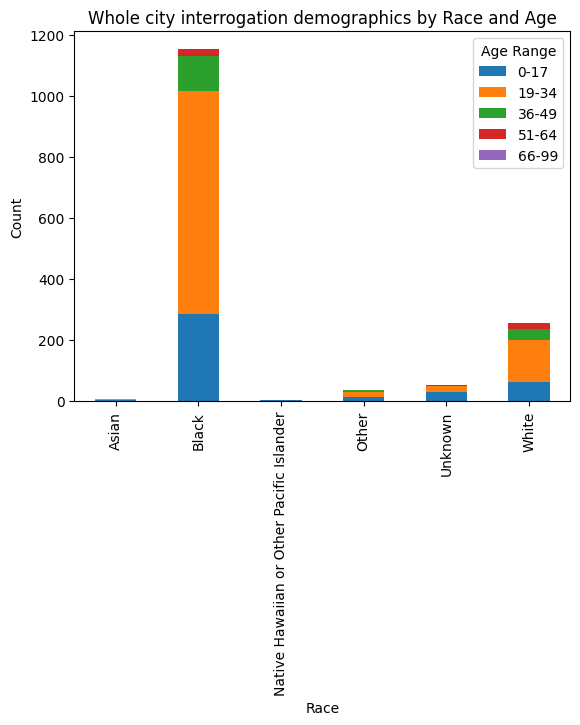

In [58]:
import matplotlib.pyplot as plt

# Define the age ranges you want to visualize
age_ranges = [(0, 18), (19, 35), (36, 50), (51, 65), (66, 100)]

# Group the data by race and age, and get the count of each demographic group
demographics = fio_firearm.groupby(['race', pd.cut(fio_firearm['age'], bins=[r[0] for r in age_ranges] + [r[1] for r in age_ranges[-1:]], labels=[f'{r[0]}-{r[1]-1}' for r in age_ranges])]).size()

# Reshape the data to a matrix with races as rows and age ranges as columns
demographics = demographics.unstack()

# Plot the data as a stacked bar chart
demographics.plot(kind='bar', stacked=True)

# Add a legend and labels
plt.legend(title='Age Range')
plt.xlabel('Race')
plt.ylabel('Count')
plt.title('Whole city interrogation demographics by Race and Age')
plt.show()


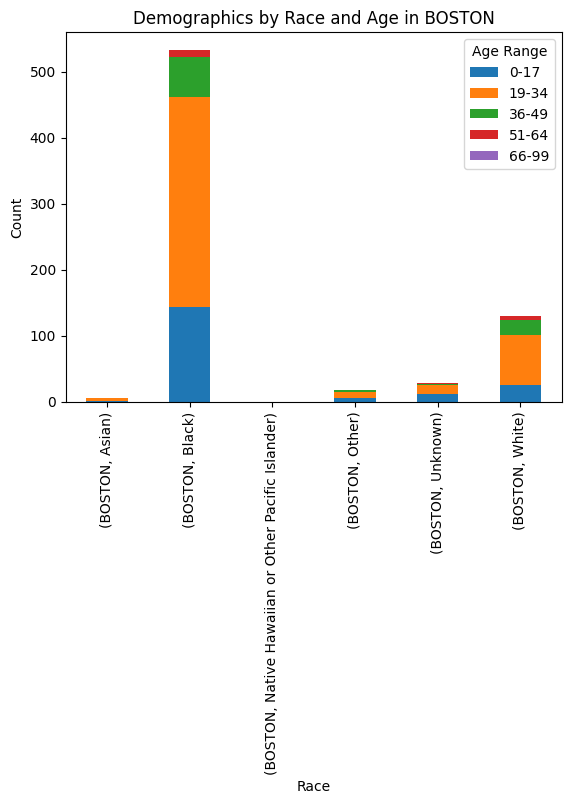

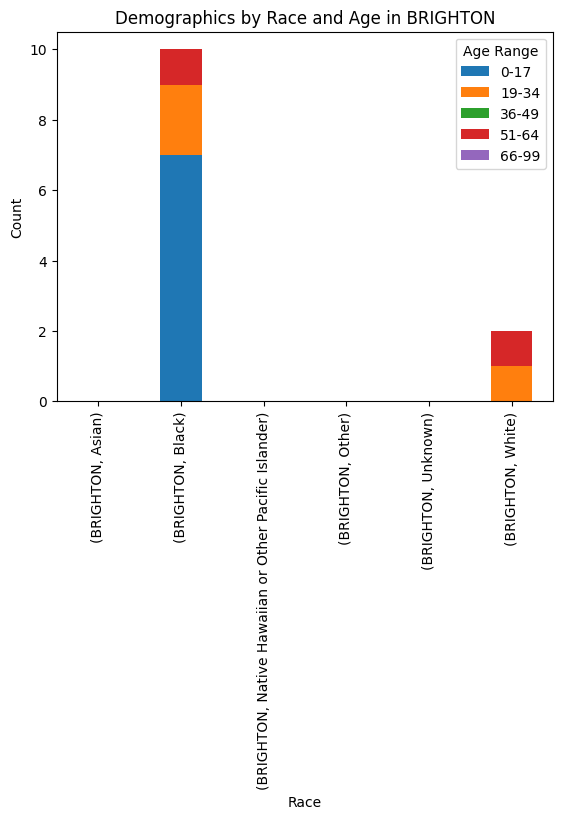

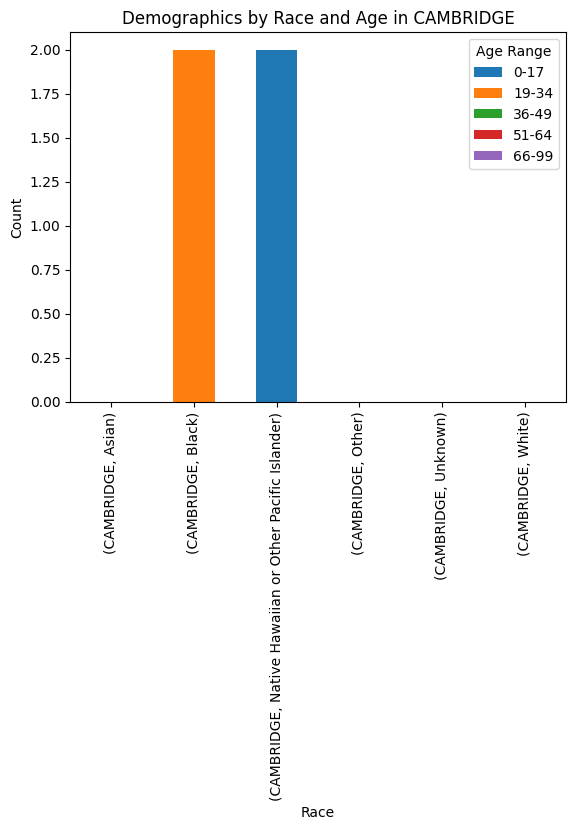

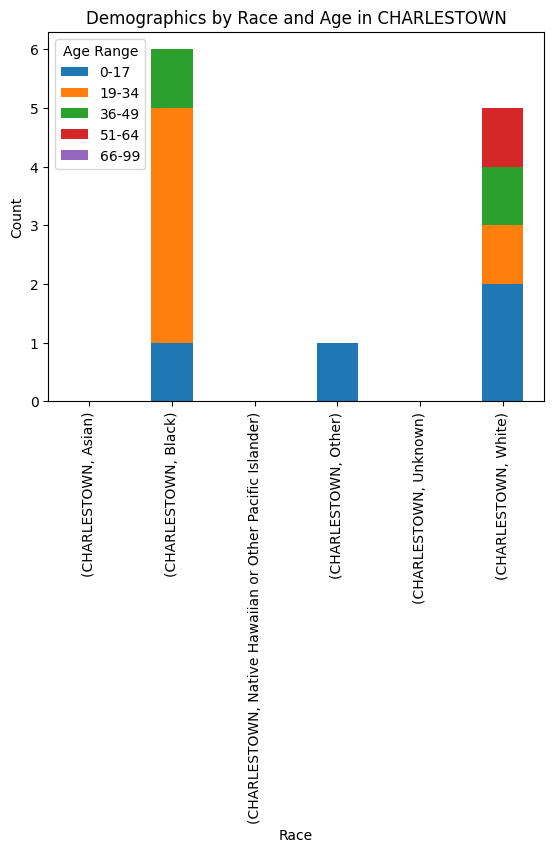

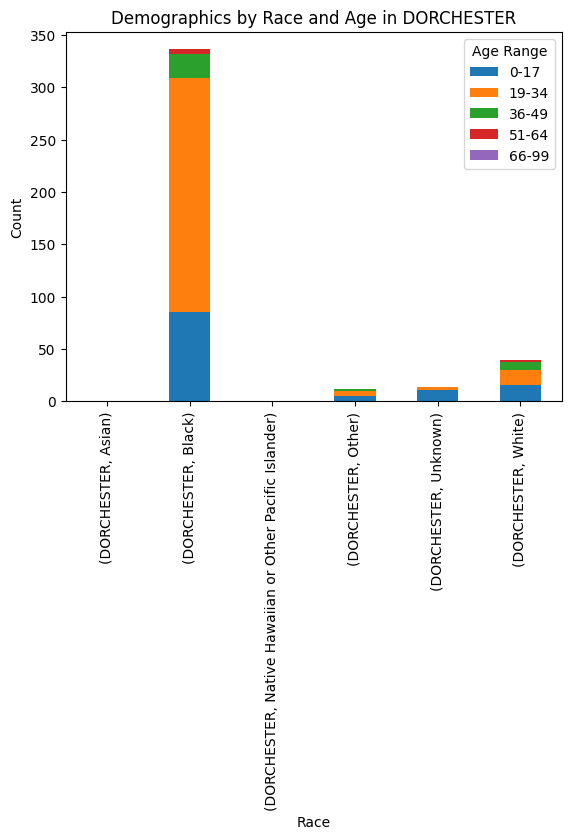

...

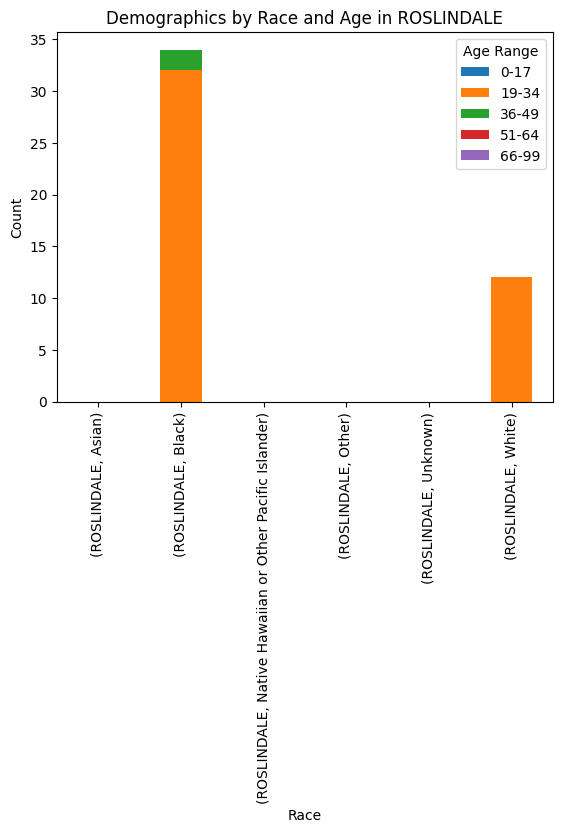

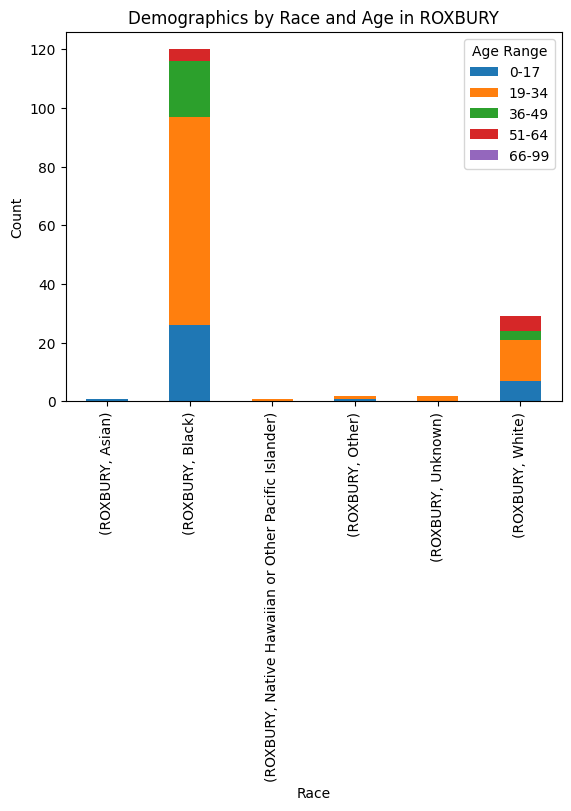

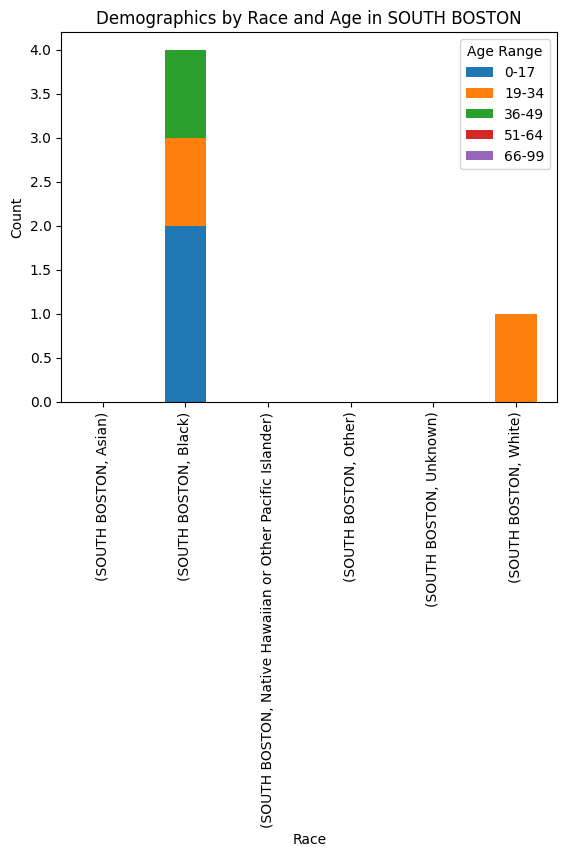

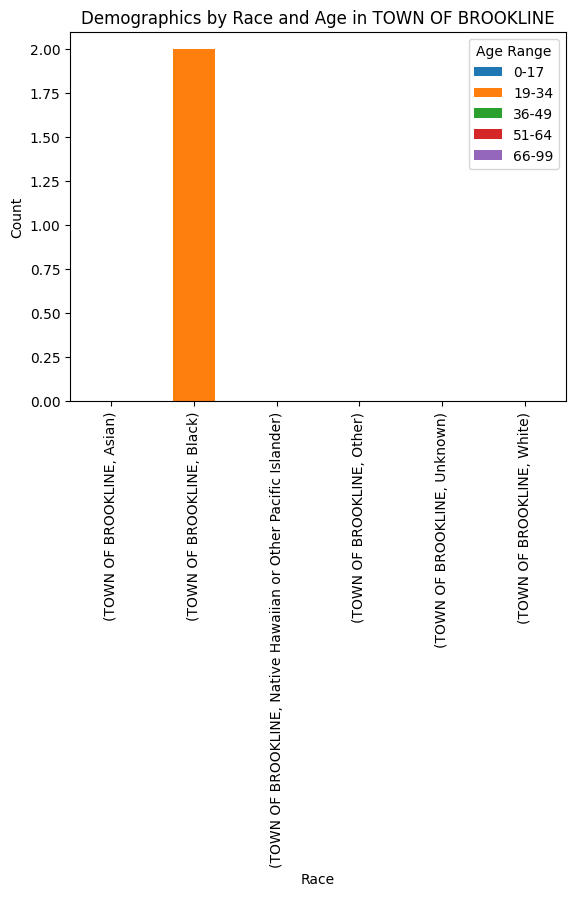

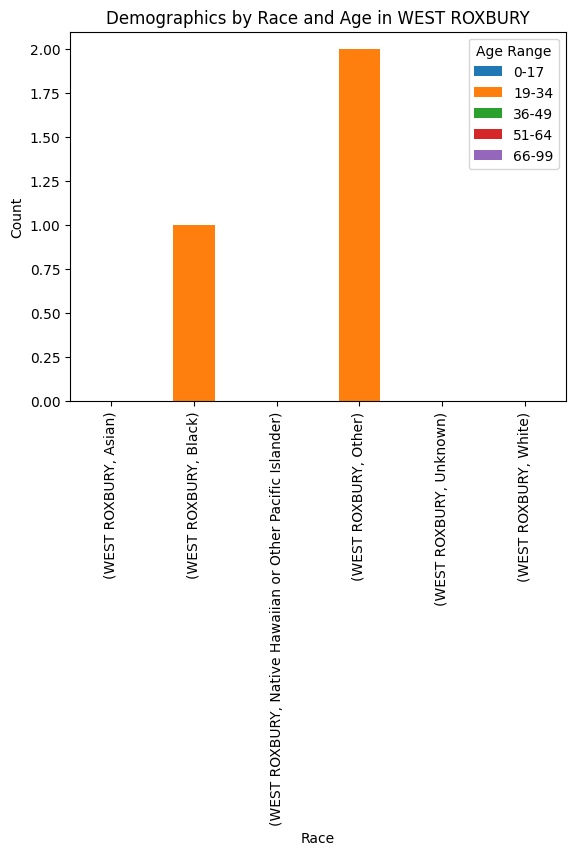

In [59]:
import matplotlib.pyplot as plt

# Define the age ranges you want to visualize
age_ranges = [(0, 18), (19, 35), (36, 50), (51, 65), (66, 100)]

# Group the data by city, race, and age, and get the count of each demographic group
demographics = fio_firearm.groupby(['city', 'race', pd.cut(fio_firearm['age'], bins=[r[0] for r in age_ranges] + [r[1] for r in age_ranges[-1:]], labels=[f'{r[0]}-{r[1]-1}' for r in age_ranges])]).size()

# Loop through each city and create a stacked bar chart
for city, data in demographics.groupby('city'):
    # Reshape the data to a matrix with races as rows and age ranges as columns
    data = data.unstack()

    # Plot the data as a stacked bar chart
    data.plot(kind='bar', stacked=True)

    # Add a legend and labels
    plt.legend(title='Age Range')
    plt.xlabel('Race')
    plt.ylabel('Count')
    plt.title(f"Demographics by Race and Age in {city}")
    plt.show()


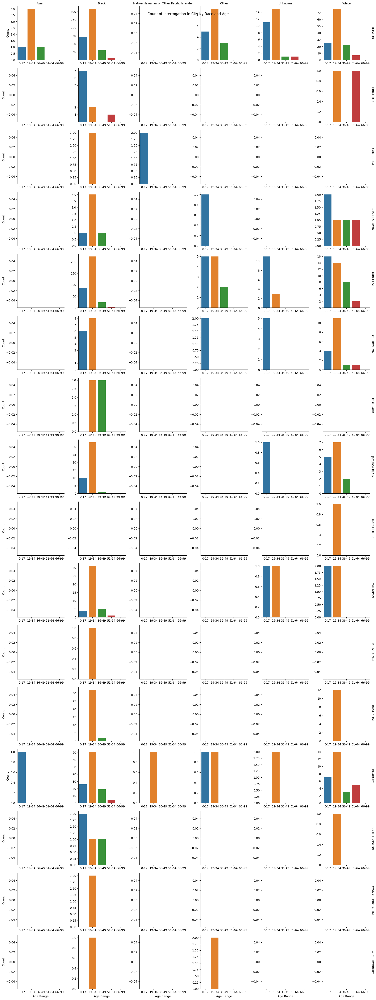

In [60]:
import seaborn as sns

# Define the age ranges you want to visualize
age_ranges = [(0, 18), (19, 35), (36, 50), (51, 65), (66, 100)]

# Group the data by city, race, and age, and get the count of each demographic group
demographics = fio_firearm.groupby(['city', 'race', pd.cut(fio_firearm['age'], bins=[r[0] for r in age_ranges] + [r[1] for r in age_ranges[-1:]], labels=[f'{r[0]}-{r[1]-1}' for r in age_ranges])]).size().reset_index(name='count')

# Create a FacetGrid with cities on the rows and race on the columns
g = sns.FacetGrid(demographics, row='city', col='race', margin_titles=True, sharex=False, sharey=False)
g.fig.suptitle('Count of Interrogation in City by Race and Age')
# Define the plot function
def plot_demographics(data, **kwargs):
    sns.barplot(x='age', y='count', data=data)

# Map the plot function to the FacetGrid
g.map_dataframe(plot_demographics, x='age', y='count')

# Set the axis labels
g.set_axis_labels('Age Range', 'Count')

# Set the plot titles
g.set_titles(row_template='{row_name}', col_template='{col_name}')

# Show the plot
plt.tight_layout()


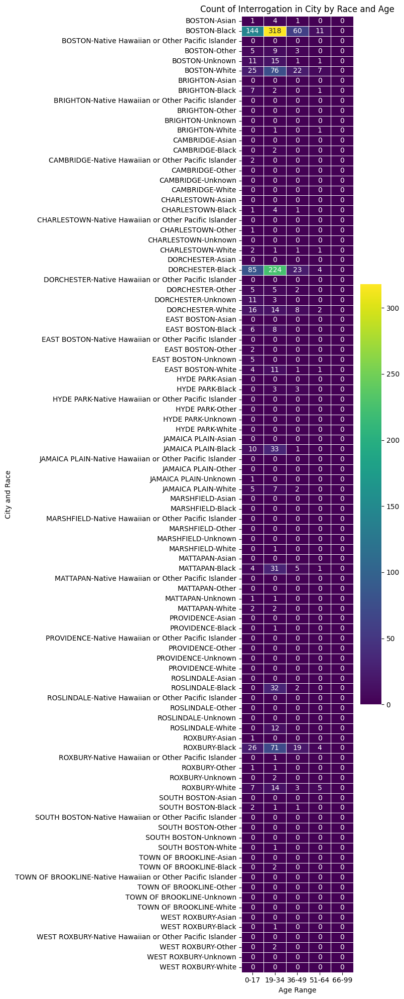

In [61]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Define the age ranges you want to visualize
age_ranges = [(0, 18), (19, 35), (36, 50), (51, 65), (66, 100)]

# Group the data by city, race, and age, and get the count of each demographic group
demographics = fio_firearm.groupby(['city', 'race', pd.cut(fio_firearm['age'], bins=[r[0] for r in age_ranges] + [r[1] for r in age_ranges[-1:]], labels=[f'{r[0]}-{r[1]-1}' for r in age_ranges])]).size().reset_index(name='count')

# Pivot the demographics data to prepare for the heatmap
pivot_demographics = demographics.pivot_table(index=['city', 'race'], columns='age', values='count', fill_value=0)

# Create the heatmap
plt.figure(figsize=(8, 20))
sns.heatmap(pivot_demographics, annot=True, fmt='.0f', cmap='viridis', linewidths=.5)

# Set the axis labels and title
plt.xlabel('Age Range')
plt.ylabel('City and Race')
plt.title('Count of Interrogation in City by Race and Age')

# Show the plot
plt.tight_layout()
plt.show()
